# Model: Random Forest Regressor
This notebook documents our process of approaching the given regression task using a RandomForestRegressor. The following approaches are documented:
* paramter optimization using RandomizedSearchCV
* paramter optimization using Hyperopt
* each of the mentioned approaches is tried with K-Fold CrossValidation and TimeSeriesSplit CrossValidation

In [1]:
from sklearn.metrics import mean_squared_error
import data_preprocessing
from sklearn.ensemble import RandomForestRegressor
from hyperopt import hp, space_eval, tpe, fmin, Trials
from math import sqrt
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt

In [2]:
# import preprocessed data
train, test = data_preprocessing.preprocess_data("Energy Consumption Dataset.csv")

In [3]:
# separate features from target variable
def split_x_y(df):
    y = df["Energy Consumption"]
    X = df.drop("Energy Consumption", axis=1)
    return X, y

X_train, y_train = split_x_y(train)
X_test, y_test = split_x_y(test)

## Using RandomizedSearchCV
First, we need to create a search grid / parameter distribution for RandomizedSearchCV to select from

In [4]:
param_dist = {
    'min_samples_leaf': randint(0, 10),
    'min_samples_split': randint(0, 10),
    'max_depth': [None, randint(10, 50)],
    'max_features': ['auto', 'sqrt', 'log2', None, randint(1, 18)],
    'ccp_alpha': uniform(0.0, 0.5),
    'max_leaf_nodes': [None, randint(10, 100)],
    'min_impurity_decrease': uniform(0.0, 0.5),
    'min_weight_fraction_leaf': uniform(0.0, 0.5),

    'n_estimators': randint(100, 500),
    'bootstrap': [True, False],
    'oob_score': [True, False], 
    'max_samples': [None, uniform(0.1, 0.5)]
}

### Using K-Fold CrossVal

In [5]:
# Create the RF Regressor
reg = RandomForestRegressor(random_state=42)
# Create the RandomizedSearchCV instance
random_search = RandomizedSearchCV(reg,
                                   param_distributions=param_dist,
                                   n_iter=1000,
                                   cv=5,
                                   random_state=42,
                                   scoring="neg_mean_squared_error")

# perform the hyperparameter optimization
random_search.fit(X_train, y_train)

c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
4740 fits failed out of a total of 5000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "c:\Users\Babett\anaconda3\Lib\site-p

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=1000,
                   param_distributions={'bootstrap': [True, False],
                                        'ccp_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001BA8DEBB8D0>,
                                        'max_depth': [None,
                                                      <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BA8DEBACD0>],
                                        'max_features': ['auto', '...
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BA8CB0B490>,
                                        'min_weight_fraction_leaf': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001BA8DEC0A90>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BA8DEC1110>,
                                        'oob_score': [True, False]},
                   random_state=42, scoring='neg_mean_squared_error')

In [6]:
# inspect the model's performance
best_score = random_search.best_score_
rmse = sqrt(-best_score)
print("RMSE: ", rmse)
print("NRMSE: ", rmse / (y_test.max() - y_test.min()))

RMSE:  10768.525916539762
NRMSE:  0.15900135718246702


In [7]:
# inspect the tuned hyperparameters
best_params = random_search.best_params_
best_params

{'bootstrap': True,
 'ccp_alpha': 0.14660538584903227,
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.37618726471884,
 'min_samples_leaf': 6,
 'min_samples_split': 8,
 'min_weight_fraction_leaf': 0.056732301008724006,
 'n_estimators': 280,
 'oob_score': False}

RMSE:  10668.58497301257
NRMSE:  0.15752569135948633


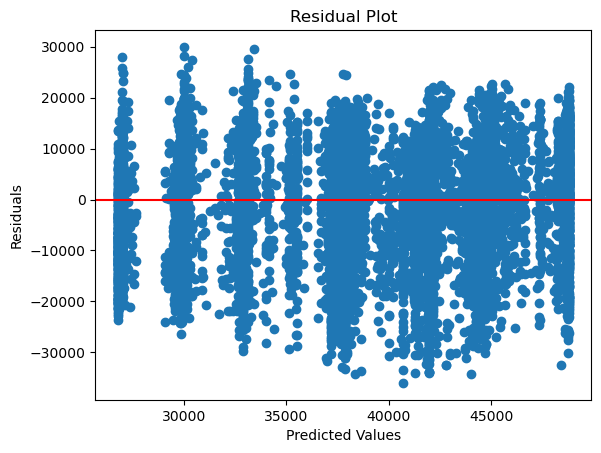

In [8]:
# Train the model on the whole dataset and predict unseen data to assess it's real performance
rf = RandomForestRegressor(**best_params, random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
rmse = sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: ", rmse)
print("NRMSE: ", rmse / (y_test.max() - y_test.min()))

plt.scatter(y_pred, y_test - y_pred)
plt.axhline(y=0, color='r', linestyle='-')  # Add a horizontal line at y=0
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

### Using TimeSeriesSplit

In [9]:
# Create TimeSeriesSplit instance
tscv = TimeSeriesSplit(n_splits=10)

In [10]:
# Create the RF Regressor
reg = RandomForestRegressor(random_state=42)
# Create the RandomizedSearchCV instance
random_search = RandomizedSearchCV(reg,
                                   param_distributions=param_dist,
                                   n_iter=1000,
                                   cv=tscv, # here, we pass TSCV instead of regular CV
                                   random_state=42,
                                   scoring="neg_mean_squared_error")

# perform the hyperparameter optimization
random_search.fit(X_train, y_train)

c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
9480 fits failed out of a total of 10000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "c:\Users\Babett\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "c:\Users\Babett\anaconda3\Lib\site-

RandomizedSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=10, test_size=None),
                   estimator=RandomForestRegressor(random_state=42),
                   n_iter=1000,
                   param_distributions={'bootstrap': [True, False],
                                        'ccp_alpha': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001BA8DEBB8D0>,
                                        'max_depth': [None,
                                                      <scipy.stats._distn_infrastructure.rv_...
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BA8CB0B490>,
                                        'min_weight_fraction_leaf': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001BA8DEC0A90>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BA8DEC1110>,
                                        'oob_score': [True, False]},
                   random_state=42, scoring='neg_mean_squared_error')

In [11]:
# inspect the model's performance
best_score = random_search.best_score_
rmse = sqrt(-best_score)
print("RMSE: ", rmse)
print("NRMSE: ", rmse / (y_test.max() - y_test.min()))

RMSE:  10736.6024529869
NRMSE:  0.1585299951715279


In [12]:
# inspect the tuned hyperparameters
best_params = random_search.best_params_
best_params

{'bootstrap': True,
 'ccp_alpha': 0.14660538584903227,
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.37618726471884,
 'min_samples_leaf': 6,
 'min_samples_split': 8,
 'min_weight_fraction_leaf': 0.056732301008724006,
 'n_estimators': 280,
 'oob_score': False}

RMSE:  10668.58497301257
NRMSE:  0.15752569135948633


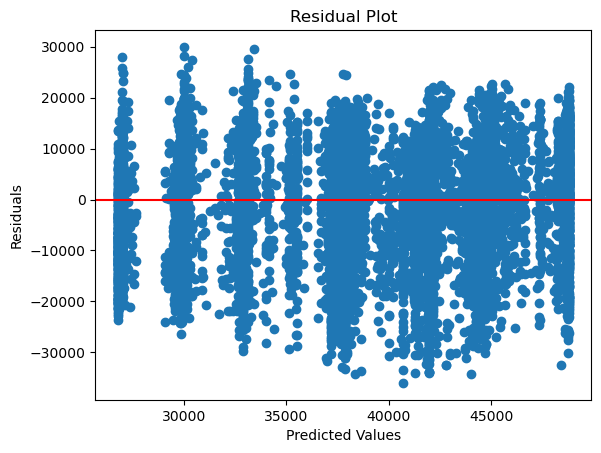

In [13]:
# Train the model on the whole dataset and predict unseen data to assess it's real performance
rf = RandomForestRegressor(**best_params, random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
rmse = sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: ", rmse)
print("NRMSE: ", rmse / (y_test.max() - y_test.min()))

plt.scatter(y_pred, y_test - y_pred)
plt.axhline(y=0, color='r', linestyle='-')  # Add a horizontal line at y=0
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()